<a href="https://colab.research.google.com/github/kavyajeetbora/metro_accessibility/blob/master/notebooks/metro_accessibility.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q osmnx
!pip install -q pandana
!pip install -q h3
!pip install -q pydeck

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 62.1 MB/s eta 0:00:00


In [2]:
import geopandas as gpd
import pandas as pd
import osmnx as ox
import shapely
import pandana as pdna
from lxml import etree
import h3
from matplotlib import colormaps
import pydeck as pdk
from urllib.request import urlopen
import json
import matplotlib.colors as mp_color
import matplotlib.cm as cmx

## Load Data

- Load the area of interest boundary
- Load station nodes and building footprints

In [84]:
json_url = 'https://raw.githubusercontent.com/kavyajeetbora/metro_accessibility/master/data/bbox.json'

response = urlopen(json_url)
bboxs = json.loads(response.read())
city = 'Mumbai'
W,S,E,N = bboxs[city]

bbox = shapely.box(W,S,E,N)

## Download the network data within AOI

In [4]:
%%time
network = ox.graph.graph_from_polygon(
    bbox,
    network_type='all',
    simplify=True,
    retain_all=False,
    truncate_by_edge=False,
    clean_periphery=None,
    custom_filter=None
)

CPU times: user 1min 47s, sys: 3.56 s, total: 1min 51s
Wall time: 1min 59s


In [5]:
%%time
nodes, edges = ox.convert.graph_to_gdfs(network, nodes=True, edges=True) #node_geometry=True, fill_edge_geometry=True
edges = edges.reset_index()

CPU times: user 19.1 s, sys: 155 ms, total: 19.2 s
Wall time: 20.1 s


In [6]:
edges.shape, nodes.shape

((216369, 19), (90965, 5))

In [7]:
%%time
network = pdna.Network(nodes["x"], nodes["y"], edges["u"], edges["v"],edges[["length"]])

CPU times: user 12.5 s, sys: 59.4 ms, total: 12.6 s
Wall time: 7 s


## Load the station data

The metro stations and lines are in KML format. We need to convert it to a gdf for further analysis

In [89]:
!wget -q https://github.com/kavyajeetbora/metro_accessibility/raw/master/data/mumbai/Mumbai_stations_stops.gpkg -O station_nodes.gpkg
station_nodes = gpd.read_file('station_nodes.gpkg', crs='EPSG:4326')
print(station_nodes.shape)
station_nodes.sample(4)

(186, 11)


,railway,internet_access,name,network,operator,public_transport,ref,train,subway,station,geometry
141,station,None,Jogeshwari East,None,None,station,None,None,yes,subway,POINT (72.85507 19.14297)
164,stop,None,Vidyanagri,Mumbai Metro,Mumbai Metro Rail Corporation Ltd,stop_position,None,None,yes,None,POINT (72.84906 19.07033)
177,stop,None,MIDC,Mumbai Metro,Mumbai Metro Rail Corporation Ltd,stop_position,None,None,yes,None,POINT (72.87421 19.11729)
78,stop,None,Sector 34,None,None,stop_position,None,None,yes,None,POINT (73.08186 19.07365)


In [90]:
!wget -q https://raw.githubusercontent.com/kavyajeetbora/metro_accessibility/master/data/mumbai/Mumbai_station_buildings.geojson -O station_buildings.geojson
station_buildings = gpd.read_file('station_buildings.geojson', crs='EPSG:4326')

print(station_buildings.shape)
station_buildings.sample(4)

(103, 9)


,height,station_name,network,operator,railway,subway,station,source,geometry
80,None,VNP & RC Marg Junction,None,None,station,None,monorail,Overture Maps,"POLYGON ((72.89426 19.05223, 72.89452 19.05298..."
40,None,Andheri,Mumbai Metro,MMRDA,stop,yes,None,Overture Maps,"POLYGON ((72.84799 19.12082, 72.84819 19.12070..."
63,None,Jagruti Nagar,Mumbai Metro,MMRDA,stop,yes,None,Overture Maps,"POLYGON ((72.90117 19.09273, 72.90128 19.09266..."
39,None,SEEPZ,Mumbai Metro,Mumbai Metro Rail Corporation Ltd,stop,yes,None,Overture Maps,"POLYGON ((72.87344 19.12583, 72.87339 19.12576..."


## Calculate the accessibility

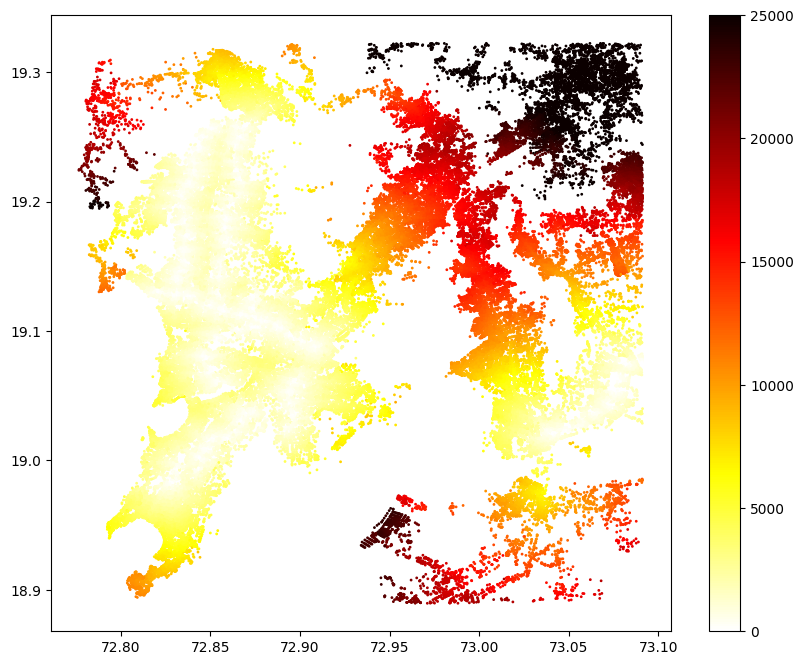

CPU times: user 7.08 s, sys: 85.8 ms, total: 7.17 s
Wall time: 6.57 s


In [91]:
%%time
# initialize each amenity category with the locations (lon/lat coordinates)

max_distance=25000 ## in meters
num_pois = 1

category = 'metro_stations'
network.set_pois(category=category, maxdist = max_distance, maxitems=num_pois, x_col=station_nodes['geometry'].x, y_col=station_nodes['geometry'].y)
accessibility = network.nearest_pois(distance = max_distance, category=category, num_pois=num_pois)

def plot_nearest_amenity(accessibility,n):
    fig, ax = network.plot(accessibility[n]);
    ax.set_facecolor('k');
    ax.set_title('Pedestrian accessibility to nearest Metro Stations in Delhi (distance to pois, in meters (n = {}))'.format(category,n), fontsize=14);
    return fig

fig = plot_nearest_amenity(accessibility,num_pois)

Note: above data is calculated for every node of the network. So compressing it to hexbins to compact the data and also makes it easier for visualization

In [92]:
%%time
APERTURE_SIZE = 9
hex_col = 'hex'+str(APERTURE_SIZE)

distance = nodes.join(accessibility)[['geometry', 1]].rename(columns={1:'distance_m'})
distance[hex_col] = distance.apply(lambda p: h3.geo_to_h3(p.geometry.y,p.geometry.x,APERTURE_SIZE),1)

distance_m = distance[[hex_col, 'distance_m']].groupby(hex_col).mean().reset_index()
# distance_m['display_text'] = distance_m['distance_m'].apply(lambda x: f"Distance: {x:.0f} meters")
distance_m.sample(5)

CPU times: user 4.12 s, sys: 152 ms, total: 4.27 s
Wall time: 4.25 s


,hex9,distance_m
3762,89608b47003ffff,3584.668945
7357,89608bcca6bffff,7331.753906
5999,89608b56a27ffff,479.748171
373,89608b093d7ffff,707.257019
6854,89608bc5167ffff,12430.564453


In [93]:
distance_m.to_parquet(f'{city}_accessibility.parquet')

Divide the distance by average speed. Here average speed is considered as 20 km/hr as per TomTom's traffic index ranking:

https://www.tomtom.com/traffic-index/ranking/?country=IN

In [94]:
distance_m['mins'] = distance_m['distance_m']/(20*16.6667)
distance_m['display_text'] = distance_m['mins'].apply(lambda x: f"Accessibility: {x:.0f} mins")
distance_m['mins'].describe()[['min','max']]

min     0.11649
max    74.99985
Name: mins, dtype: float64

## Visualizing in 3D map

In [95]:
distance_m.head()

,hex9,distance_m,mins,display_text
0,89608b0100bffff,4010.660889,12.031959,Accessibility: 12 mins
1,89608b01013ffff,4452.538276,13.357588,Accessibility: 13 mins
2,89608b0101bffff,4115.004687,12.344989,Accessibility: 12 mins
3,89608b01043ffff,3683.743734,11.051209,Accessibility: 11 mins
4,89608b0104bffff,3139.405029,9.418196,Accessibility: 9 mins


In [96]:
def create_custom_cmap(values):
    # Define the colors for the colormap
    colors = ['#42f5da', '#7DDA58', '#DECE58', '#DE8758', '#DE5858']

    # Create the colormap object
    cmap = mp_color.ListedColormap(colors)

    # Define the color boundaries for the colormap
    boundaries = values

    # Create the normalization object
    norm = mp_color.BoundaryNorm(boundaries, len(colors))

    return cmap, norm

def get_color_value(value, cmap, norm):
    # Normalize the value to the range of the colormap
    norm_value = norm(value)

    # Get the color value from the colormap
    color = cmap(norm_value)

    scaled_colors = list(map(lambda x: int(x*255), color[:3]))
    scaled_alpha = int(color[3]*100)

    scaled_colors += [scaled_alpha]
    return scaled_colors


def colormap_dataframe(df, value_col, cmap, norm, max_val=None):

    xdf = df.copy()
    # if max_val is None:
    #     max_val = xdf[value_col].max()

    ## Scale the temperature values between 0-1; using MinMax Scaler
    # xdf[f'norm_{value_col}'] = (xdf[value_col]-xdf[value_col].min())/(max_val-xdf[value_col].min())
    # xdf['color'] = xdf[f'norm_{value_col}'].apply(lambda x: get_color_value(x, cmap, norm))

    xdf['color'] = xdf[f'{value_col}'].apply(lambda x: get_color_value(x, cmap, norm))
    xdf[['R', 'G', 'B', 'A']] = pd.DataFrame(xdf['color'].to_list())
    xdf = xdf.drop(['color'], axis=1)

    xdf[value_col] = xdf[value_col].round(1)

    return xdf

def create_h3_hex_layer(df):

    # Define a layer to display on a map
    layer = pdk.Layer(
        "H3HexagonLayer",
        df,
        pickable=True,
        stroked=True,
        filled=True,
        extruded=False,
        get_hexagon=hex_col,
        get_fill_color="[R, G, B, A]"
    )

    return layer

### Load Station Building Footprints

In [97]:
station_viz = station_buildings.copy()
station_viz = station_viz.fillna("")
station_viz.loc[:, 'display_text'] = station_viz.loc[:, ['station_name', 'network']].apply(lambda x: f"Metro Station: {x[0]}<br>Network: {x[1]}", axis=1)
station_viz_json=eval(station_viz.to_json())

<ipython-input-97-e8091d92b584>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  station_viz.loc[:, 'display_text'] = station_viz.loc[:, ['station_name', 'network']].apply(lambda x: f"Metro Station: {x[0]}<br>Network: {x[1]}", axis=1)


In [98]:
station_viz.to_file(f'{city}_station_buildings.geojson', driver='GeoJSON')

### Load Metro Lines

In [99]:
!wget -q https://github.com/kavyajeetbora/metro_accessibility/raw/master/data/mumbai/Mumbai_public_transport_route.geojson -O metro_lines.geojson
metro_lines = gpd.read_file('metro_lines.geojson')
metro_lines.loc[:, 'display_text'] = metro_lines.apply(lambda x: f"Route: {x[0]}<br>Network: {x[1]}", axis=1)
metro_lines['path'] = path = metro_lines['geometry'].apply(lambda x: [[i[0], i[1]] for i in x.coords])
metro_lines = metro_lines.drop('geometry',axis=1)

def hex_to_rgb(h):
    h = h.lstrip("#")
    return list(int(h[i : i + 2], 16) for i in (0, 2, 4))


metro_lines["color"] = 'black'
metro_lines.to_json(f'{city}_metro_lines.json')

<ipython-input-99-a8cf113edd8d>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  metro_lines.loc[:, 'display_text'] = metro_lines.apply(lambda x: f"Route: {x[0]}<br>Network: {x[1]}", axis=1)


In [100]:
metro_lines = pd.read_json(f'{city}_metro_lines.json')
metro_lines.head()

,name,railway,network,operator,source,start_date,display_text,path,color
0,Mumbai Metro Line 1,subway,Mumbai Metro,MMRDA,None,2014-06-08,Route: Mumbai Metro Line 1<br>Network: subway,"[[72.8213871, 19.1302777], [72.8223862, 19.130...",black
1,Navi Mumbai Metro Line 1,subway,None,None,None,2023-11-17,Route: Navi Mumbai Metro Line 1<br>Network: su...,"[[73.0395793, 19.0202992], [73.0402367, 19.020...",black
2,None,monorail,None,None,None,None,Route: None<br>Network: monorail,"[[72.8740487, 19.0401585], [72.8740988, 19.040...",black
3,Mumbai Monorail Phase1,monorail,None,None,gps,None,Route: Mumbai Monorail Phase1<br>Network: mono...,"[[72.8969498, 19.0602298], [72.8965467, 19.059...",black
4,Mumbai Metro Line 1,subway,Mumbai Metro,None,None,None,Route: Mumbai Metro Line 1<br>Network: subway,"[[72.8278398, 19.1321547], [72.8276642, 19.132...",black


### Plot the layers in one map

In [101]:
station_viz = gpd.read_file(f'{city}_station_buildings.geojson')
station_viz_json = eval(station_viz.to_json())

In [102]:
station_layer = pdk.Layer(
    'GeoJsonLayer',
    data=station_viz_json,
    stoked=True,
    getLineColor=[158, 2, 38,100],
    getLineWidth=10,
    filled=True,
    get_fill_color=[158, 2, 38,100],
    extruded=True,
    get_elevation=30,
    pickable=True
)

route_layer =  pdk.Layer(
    'PathLayer',
    data=metro_lines,
    pickable=True,
    get_color='black',
    width_scale=1,
    get_path="path",
    get_width=1
)

## Apply the colormap to the dataframe
# cmap: PRGn
# cmap = colormaps['summer']
cmap,norm = create_custom_cmap([0,5,10,20,40,distance_m['mins'].max()])
xdf = colormap_dataframe(df=distance_m, value_col='mins', cmap=cmap, norm=norm)

## Now create a H3HexagonLayer
layer = create_h3_hex_layer(xdf)

# Set the viewport location
boundary = bbox
x,y = boundary.centroid.x, boundary.centroid.y
view_state = pdk.ViewState(latitude=y, longitude=x, zoom=11, bearing=0, pitch=45)

tooltip = {
        "html": "{display_text}",
        "style": {
            "backgroundColor": "#4CAF50",   # Green shade for background
            "color": "#FFFFFF",             # White for text color
            "border": "2px solid #4CAF50",  # Matching border color
            "borderRadius": "5px",          # Rounded corners
            "boxShadow": "2px 2px 10px rgba(0, 0, 0, 0.2)"  # Soft shadow effect
        }
    }

# # Render
r = pdk.Deck(layers=[station_layer, layer, route_layer], initial_view_state=view_state, tooltip=tooltip)
r

<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": 0,
    "latitude": 19.1059366262,
    "longitude": 72.93125120724999,
    "pitch": 45,
    "zoom": 11
  },
  "layers": [
    {
      "@@type": "GeoJsonLayer",
      "data": {
        "features": [
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    72.8667885,
                    19.2568815
                  ],
                  [
                    72.8668843,
                    19.257084
                  ],
                  [
                    72.8665558,
                    19.2572225
                  ],
                  [
                    72.8662183,
                    19.2573401
                  ],
                  [
                    72.8658732,
                    19.2574362
                  ],
                  [
                    72.8655221,
                    19.2575103
                  ],
                  [
                    72.8651666,
                    19.2575623
                  ],
                  [
                    72.8651307,
                    19.2573432
                  ],
                  [
                    72.8654785,
                    19.2572924
                  ],
                  [
                    72.8658143,
                    19.2572214
                  ],
                  [
                    72.8661443,
                    19.2571295
                  ],
                  [
                    72.8664671,
                    19.257017
                  ],
                  [
                    72.8667885,
                    19.2568815
                  ]
                ]
              ],
              "type": "Polygon"
            },
            "id": "0",
            "properties": {
              "display_text": "Metro Station: Anand Nagar (Dahisar)<br>Network: Mumbai Metro",
              "height": "",
              "network": "Mumbai Metro",
              "operator": "MMRDA",
              "railway": "stop",
              "source": "Overture Maps",
              "station": "None",
              "station_name": "Anand Nagar (Dahisar)",
              "subway": "yes"
            },
            "type": "Feature"
          },
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    72.8499057,
                    19.256181
                  ],
                  [
                    72.8500688,
                    19.2559858
                  ],
                  [
                    72.8507743,
                    19.2565445
                  ],
                  [
                    72.8514504,
                    19.2570121
                  ],
                  [
                    72.851294,
                    19.2572195
                  ],
                  [
                    72.8506093,
                    19.2567593
                  ],
                  [
                    72.8499057,
                    19.256181
                  ]
                ]
              ],
              "type": "Polygon"
            },
            "id": "1",
            "properties": {
              "display_text": "Metro Station: Kandarpada<br>Network: None",
              "height": "",
              "network": "None",
              "operator": "None",
              "railway": "station",
              "source": "Overture Maps",
              "station": "subway",
              "station_name": "Kandarpada",
              "subway": "yes"
            },
            "type": "Feature"
          },
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    72.8674626,
                    19.2519017
                  ],
                  [
                    72.8664726,
                    19.2505086
                  ],
                  [
                    72.866663,
                    19.250388
         

## TODO


2. Try including ghazibad, noida, faridabad and Gurgaon area also to capture the whole NCR region ✅
3. Plot the visualization using kepler.gl to toggle the layers on/off
4. Exlcude the depots from the metro station table ✅
5. Store the extracted area of the OSM network as parquet files on github, try querying the network using DuckDB ✅
6. Next once the pipeline is built, replicate it for other cities: Mumbai, Bangalore, Hyderabad, Chennai and Kolkata
7. Limit the accessibility time to 20 mins or so